In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
def select_network(network_num, chosen_data):

    data_ret = chosen_data[(chosen_data['PharmNetworkID'] == network_num)]

    groupcols = ['PharmNetworkName', 'SaleMonth']
    data_ret = data_ret.groupby(groupcols)[['Sale20']].sum()
    data_ret = data_ret.reset_index()

    phname = chosen_data[chosen_data['PharmNetworkID'] == network_num]
    phname_ret = phname.iloc[0]['PharmNetworkName']

    label_ret = 'Аптечная сеть: '

    return data_ret, phname_ret, label_ret

In [3]:
def build_graph(data123, label1, name1):
    fig, ax = plt.subplots(1, 1, figsize=(15,5))
    #data123['Sale20'].plot(label=name1)
    plt.plot(data123['SaleMonth'], data123['Sale20'], label=name1) 

    #plt.xlabel('dates', fontsize=14)
    ax = plt.gca()
    
    plt.xticks(np.arange(1, len(dates2)+1, 1.0))
    ax.set_xticklabels(dates2['SaleMonth'], fontsize=15, rotation=30)
    #ax.set_xticklabels(data123['SaleMonth'], fontsize=12, rotation=30)
    #plt.xticks(np.arange(1, len(dates)+1, 1.0))
    plt.tight_layout()

    plt.ylabel('Продажи', fontsize=20)
    plt.xlabel('Месяц', fontsize=20)
    plt.title(label1 + name1, fontsize=24)
    #plt.savefig(name1 +'.png', dpi=300, bbox_inches='tight')
    plt.legend()
    plt.show()

In [4]:
def select_region(region_num, dataregions):

    na_reg = dataregions[dataregions['RegionYandexNameL3ID'] == region_num]
    name_reg_ret = na_reg.iloc[0]['RegionYandexNameL3']

    label_reg_ret = 'Регион: '


    data_reg_ret = dataregions[(dataregions['RegionYandexNameL3ID'] == region_num)]

    groupcols2 = ['RegionYandexNameL3ID', 'RegionYandexNameL3', 'SaleMonth']
    data_reg_ret = data_reg_ret.groupby(groupcols2)[['Sale20']].sum()
    data_reg_ret = data_reg_ret.reset_index()
    
    return data_reg_ret, name_reg_ret, label_reg_ret

In [5]:
data = pd.read_excel('Sale_2018.xlsx', sheet_name='DrugstoreSale')
pharmnetworks = pd.read_excel('Dictionary.xlsx', sheet_name='Pharmnetworks')
drugstores = pd.read_excel('Drugstores.xlsx', sheet_name='DrugstoreListFN')

In [6]:
data_cor = data.merge(pharmnetworks, left_on='PharmNetworkID', right_on='PharmNetworkID', how='left')
#data2.head()

cols = data.columns.tolist()
#print(cols)
cols = cols[-1:] + cols[:-1]
#print(cols)

data_cor['Sale20'] = data['SaleQuantity']*data['ProductID']

columns_drugstores = ['DrugstoreFNID', 'RegionYandexNameL3', 'RegionYandexNameL3ID']
drugstores_region = drugstores[columns_drugstores]

data_cor = data_cor.merge(drugstores_region, left_on='DrugstoreFNID', right_on='DrugstoreFNID', how='left')
#target_columns = ['PharmNetworkID', 'PharmNetworkName', 'SaleYear', 'SaleMonth', 'ProductID', 'SaleQuantity']
#data2 = data2[target_columns]

data_cor = data_cor.fillna(0)
data_cor['RegionYandexNameL3ID'] = data_cor['RegionYandexNameL3ID'].astype(int)


dates = sorted(data['SaleMonth'].unique())
dates2 = pd.DataFrame({'SaleMonth':dates})
######################################################################


data2_columns = ['PharmNetworkID', 'PharmNetworkName', 'SaleMonth', 'ProductID', 'Sale20']
data2 = data_cor[data2_columns]

region_columns = ['RegionYandexNameL3ID', 'RegionYandexNameL3', 'SaleMonth', 'Sale20']
data_region = data_cor[region_columns]

# Построение графика продаж за 2018 год для выбранной Аптечной Сети #

In [7]:
pharmid = 1

######

data_select, name1, label1 = select_network(pharmid, data2)
data_select

,PharmNetworkName,SaleMonth,Sale20
0,Ригла,1,189063
1,Ригла,2,86378
2,Ригла,3,122871
3,Ригла,4,83771
4,Ригла,5,46631
5,Ригла,6,35303
6,Ригла,7,29725
7,Ригла,8,52508
8,Ригла,9,107606
9,Ригла,10,84903


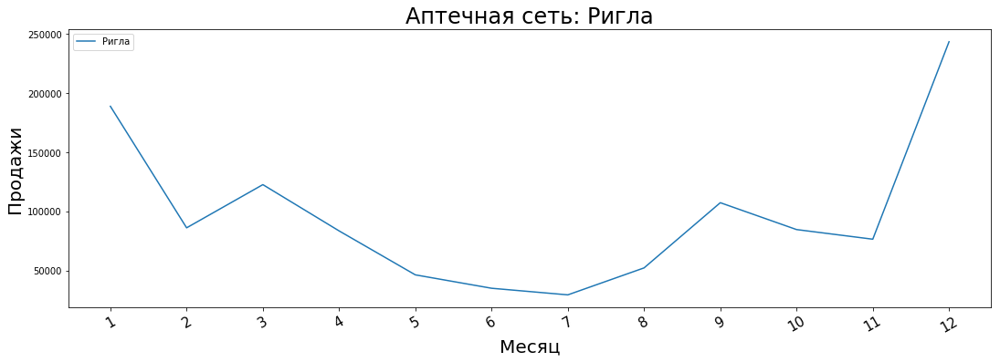

In [8]:
build_graph(data_select, label1, name1)

# Построение графика для 1-го региона #

In [9]:
number_region = 78

#########################

data_reg_in, name_reg_in, label_reg_in = select_region(number_region, data_region)
data_reg_in

,RegionYandexNameL3ID,RegionYandexNameL3,SaleMonth,Sale20
0,78,Санкт-Петербург,1,70696
1,78,Санкт-Петербург,2,96373
2,78,Санкт-Петербург,3,127685
3,78,Санкт-Петербург,4,60032
4,78,Санкт-Петербург,5,32894
5,78,Санкт-Петербург,6,30765
6,78,Санкт-Петербург,7,26112
7,78,Санкт-Петербург,8,36605
8,78,Санкт-Петербург,9,126553
9,78,Санкт-Петербург,10,83750


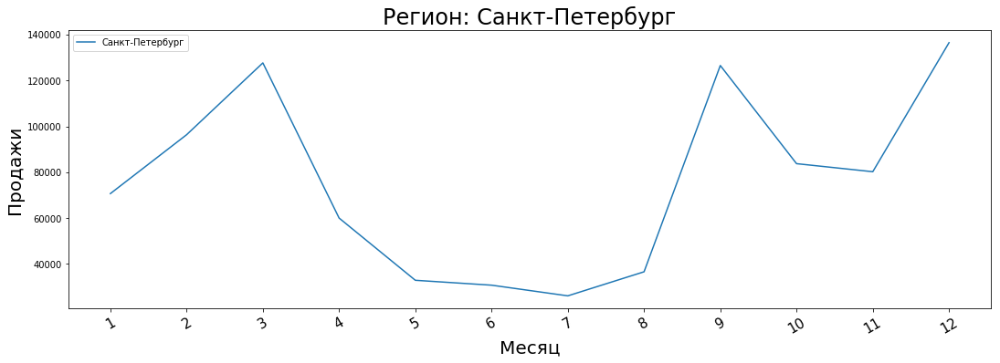

In [10]:
build_graph(data_reg_in, label_reg_in, name_reg_in)

# Построение графиков продаж для НЕСКОЛЬКИХ Аптечных Сетей #

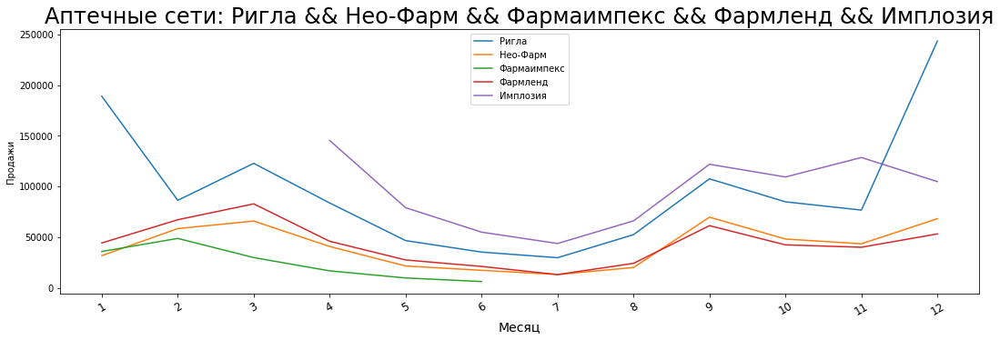

In [11]:
several_n = [1, 3, 4, 93, 94]

#####################
qnames = []
fig, ax = plt.subplots(1, 1, figsize=(15,5))
for i in several_n:
    qdata, qname, qlabel = select_network(i, data2)
    plt.plot(qdata['SaleMonth'], qdata['Sale20'], label=qname) 
    #qdata['Sale20'].plot(label=qname)
    qnames.append(qname)
    
re_label = 'Аптечные сети: '
re_label2 = 'Аптечные сети '

plt.xlabel('dates', fontsize=14)
ax = plt.gca()
plt.xticks(np.arange(1, len(dates2)+1, 1.0))
ax.set_xticklabels(dates2['SaleMonth'], fontsize=12, rotation=30)
plt.tight_layout()

plt.ylabel('Продажи')
plt.xlabel('Месяц')

string_qname = ' && '.join(qnames)
    
plt.title(re_label + string_qname, fontsize=24)


# СОХРАНЕНИЕ ГРАФИКА
#plt.savefig(re_label2 + string_qname +'.png', dpi=300, bbox_inches='tight')


plt.legend()
plt.show()

# Построение графика для НЕСКОЛЬКИХ регионов #

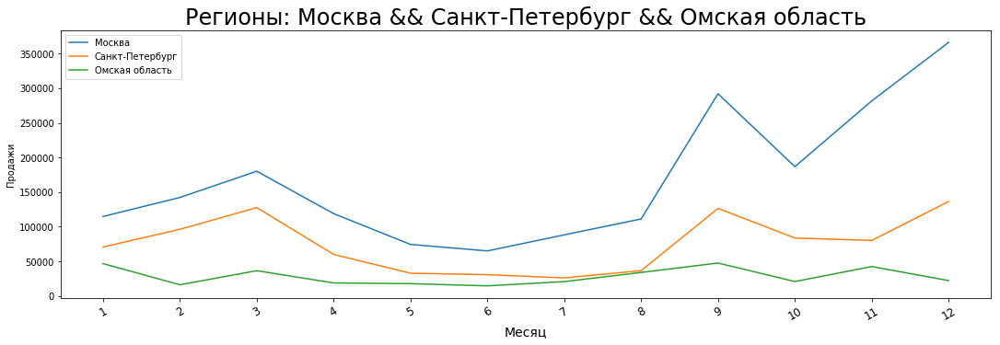

In [12]:
several_regions = [77, 78, 55]

#####################
qnames_r = []
fig, ax = plt.subplots(1, 1, figsize=(15,5))
for j in several_regions:
    qdata_r, qname_r, qlabel_r = select_region(j, data_region)
    #qdata_r['Sale20'].plot(label=qname_r)
    plt.plot(qdata_r['SaleMonth'], qdata_r['Sale20'], label=qname_r) 
    qnames_r.append(qname_r)
    
re_label_r = 'Регионы: '
re_label_r2 = 'Регионы '

plt.xlabel('dates', fontsize=14)
ax = plt.gca()
plt.xticks(np.arange(1, len(dates2)+1, 1.0))
ax.set_xticklabels(dates2['SaleMonth'], fontsize=12, rotation=30)
plt.tight_layout()

plt.ylabel('Продажи')
plt.xlabel('Месяц')

string_qname_r = ' && '.join(qnames_r)
    
plt.title(re_label_r + string_qname_r, fontsize=24)

# СОХРАНЕНИЕ ГРАФИКА
#plt.savefig(re_label_r2 + string_qname_r +'.png', dpi=300, bbox_inches='tight')

plt.legend()
plt.show()

# Просмотр аптечных сетей #

In [13]:
network_cols = ['PharmNetworkName', 'PharmNetworkID', 'PharmNetworkType2']
pharmnetworks = pharmnetworks.sort_values(by=['PharmNetworkType', 'PharmNetworkName'])
network_id = pharmnetworks[network_cols]
network_id = network_id.drop_duplicates()
network_id = network_id.sort_values(by=['PharmNetworkID'])
network_id = network_id.reset_index()
network_id = network_id[network_cols]

pd.options.display.max_rows = 150

#pharmnetworks

In [14]:
regions_cols = ['RegionYandexNameL3', 'RegionYandexNameL3ID']
regions_id = data_region[regions_cols]
regions_id = regions_id.drop_duplicates()
regions_id = regions_id.sort_values(by=['RegionYandexNameL3ID'])
regions_id = regions_id.reset_index()
regions_id = regions_id[regions_cols]

#regions_id

Открытие 2017 годв

In [15]:
data2017 = pd.read_excel('Sale_2017.xlsx', sheet_name='DrugstoreSale')
drugstores2017 = pd.read_excel('Sale_2017.xlsx', sheet_name='DrugstoreList')

In [16]:
drug2017cols = ['CityName', 'DrugstoreID']
drug2017_city = drugstores2017[drug2017cols]

data2017cols = ['PharmNetworkName', 'DrugstoreID', 'SaleMonth', 'SaleQuantity']
data2017_normal = data2017[data2017cols]

data2017mer = []

data2017mer = data2017_normal.merge(drug2017_city, left_on='DrugstoreID', right_on='DrugstoreID', how='left')
data2017mer['Sale20'] = data2017mer['SaleQuantity']
data2017mer['PharmNetworkID'] = np.where(data2017mer['PharmNetworkName'] == 'МЕГА ФАРМ', 5, 0)
data2017mer['ProductID'] = 1

data2017mer2 = data2017mer[data2_columns]
data2017mer2['PharmNetworkID'] = data2017mer2['PharmNetworkID'].astype(int)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


Открытие 2019 года

In [17]:
data2019 = pd.read_excel('Sale_2019.xlsx', sheet_name='DrugstoreSale')
drugstores2019 = pd.read_excel('Sale_2019.xlsx', sheet_name='DrugstoreListFN')

In [18]:
data2_2019 = pd.DataFrame()
data_cor2019 = pd.DataFrame()

data_cor2019 = data2019
data_cor2019 = data_cor2019.fillna(0)
data_cor2019['Sale20'] = data2019['SaleQuantity']*data2019['ProductID']

columns_drugstores2019 = ['DrugstoreFNID', 'RegionYandexNameL3', 'RegionYandexNameL3ID']
drugstores_region2019 = drugstores2019[columns_drugstores2019]

data_cor2019 = data_cor2019.merge(drugstores_region2019, left_on='DrugstoreFNID', right_on='DrugstoreFNID', how='left')

data_columns2019 = ['PharmNetworkID', 'PharmNetworkName', 'SaleMonth', 'ProductID', 'Sale20']
data2_2019 = data_cor2019[data_columns2019]

#data2_2019

ДОБАВЛЛЕНИЕ ID В 2017 ГОД

In [19]:
#data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'еАптека', 30, data2017mer2['PharmNetworkID'])
data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'Ригла (Будь Здоров)', 1, data2017mer2['PharmNetworkID'])
#data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'Имплозия', 94, data2017mer2['PharmNetworkID'])
#data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'ЭРКАФАРМ', 17, data2017mer2['PharmNetworkID'])
#data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'Апрель', 36, data2017mer2['PharmNetworkID'])
#data2017mer2['PharmNetworkID'] = np.where(data2017mer2['PharmNetworkName'] == 'ИП Гончарова', 9, data2017mer2['PharmNetworkID'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [20]:
networks2017_without_id = data2017mer2[data2017mer2['PharmNetworkID'] == 0]
networks2017_without_id['PharmNetworkName'].unique()

array(['Имплозия', 'Мелодия здоровья', 'Нео-Фарм, Столички',
       'Планета здоровья, ОПЕКА', 'Фармаимпекс', 'Аптека Таймер',
       'ИРИС-ТД', 'ИРИС-ФК', 'ИРИС-ХМ', 'ФК', 'ТД', 'ХМ', 'ФК/ХМ',
       'ПроАптека', 'AVE +36.6', 'АСНА', 'Мобила (Вита)', 'Живика',
       'Самсон-Фарма', 'еАптека', 'Аптека-сити', 'Гармония Плюс', 'МИС',
       'ИП Коуров', 'Сконто', 'ИП Калганова', 'ИП Зорина', 'ЭРКАФАРМ',
       'ИП Бережная', 'Бонум', 'Социальная аптека', 'Тиннер-Б', 'Сияние',
       'Лекомед', 'Губернские аптеки', 'ИП Гончарова',
       'Фармация Мурманская', 'Аптека Вашей семьи',
       'Здоровье (Усть-Лабинск)', 'ИП Лещинская', 'Аптека РОСФАРМСНАБ',
       'Апрель', 'Фармгарант', 'Рослек', 'Аптечный дом',
       'Гармония здоровья', 'ИП Чубова', 'Левзея', 'Эвалар', 'Диалог',
       'Сатурн (Экономъ)', 'Здоров.ру', 'Солнышко', 'А.Р.М.',
       'Здоровый город', 'ЕКАТЕРИНБУРГ - Фармарт', 'Аптечный Дом Рязань',
       'Алвик', 'Источник здоровья', 'Классика', 'Столет',
       'Новая боль

In [21]:
#writer = pd.ExcelWriter('2017_year_with_ID.xlsx', engine='xlsxwriter')
#data2017mer2.to_excel(writer, sheet_name='123', index=False)
#writer.save()

# Сравнение 2017-2018-2019 годов

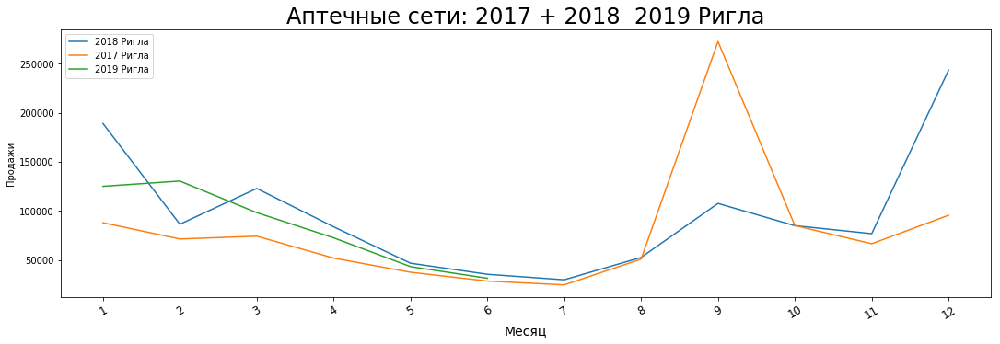

In [22]:
pharm_compare = 1

#####################
qnames = []
fig, ax = plt.subplots(1, 1, figsize=(15,5))
qdata, qname, qlabel = select_network(pharm_compare, data2)
plt.plot(qdata['SaleMonth'], qdata['Sale20'], label='2018 ' + qname) 
qnames.append('2018 ' + qname)

qdata3, qname3, qlabel3 = select_network(pharm_compare, data2017mer2)
plt.plot(qdata3['SaleMonth'], qdata3['Sale20'], label='2017 ' + qname) 
qnames.append('2017 ' + qname)
ax.set_xticklabels(qdata3['SaleMonth'], fontsize=12, rotation=30)

qdata5, qname5, qlabel5 = select_network(pharm_compare, data2_2019)
plt.plot(qdata5['SaleMonth'], qdata5['Sale20'], label='2019 ' + qname) 
qnames.append('2019 ' + qname)
ax.set_xticklabels(qdata5['SaleMonth'], fontsize=12, rotation=30)
   
re_label = 'Аптечные сети: '
re_label2 = 'Аптечные сети '

plt.xlabel('dates', fontsize=14)
ax = plt.gca()
plt.xticks(np.arange(1, len(dates2)+1, 1.0))
ax.set_xticklabels(dates2['SaleMonth'], fontsize=12, rotation=30)
plt.tight_layout()
plt.ylabel('Продажи')
plt.xlabel('Месяц')

string_qname = ' && '.join(qnames)   
plt.title(re_label + '2017 +'+ ' 2018 ' + ' 2019 '+ qname, fontsize=24)

# СОХРАНЕНИЕ ГРАФИКА
#plt.savefig(re_label2 + string_qname +'.png', dpi=300, bbox_inches='tight')

plt.legend()
plt.show()

# Тестовый график

In [23]:
d = {'SaleMonth': [1,2,3,4,5,6,7,8,9,10,11,12]}
qdata4 = pd.DataFrame(data=d)
qdata4 = qdata4.merge(qdata, left_on='SaleMonth', right_on='SaleMonth', how='left')
qdata4 = qdata4.merge(qdata3, left_on='SaleMonth', right_on='SaleMonth', how='left')
qdata4 = qdata4.merge(qdata5, left_on='SaleMonth', right_on='SaleMonth', how='left')

qdata4['2018'] = qdata4['Sale20_x']
qdata4['2017'] = qdata4['Sale20_y']
qdata4['2019'] = qdata4['Sale20']

qdata4 = qdata4.drop(['PharmNetworkName_x', 'Sale20_x', 'PharmNetworkName_y', 'Sale20_y'], axis=1)
qdata4 = qdata4.set_index('SaleMonth')
qdata4 = qdata4.fillna(0)
qdata4['2017'] = qdata4['2017'].astype(int)
qdata4['2018'] = qdata4['2018'].astype(int)
qdata4['2019'] = qdata4['2019'].astype(int)

qdata4.sort_index(inplace=True)

#qdata4

In [24]:
qdata4 = qdata4[['2017', '2018', '2019']]
qdata4

,2017,2018,2019
SaleMonth,,,
1,87886,189063,125051
2,71355,86378,130401
3,74197,122871,98216
4,51826,83771,72533
5,37386,46631,43120
6,28425,35303,31267
7,24543,29725,0
8,50787,52508,0
9,272739,107606,0


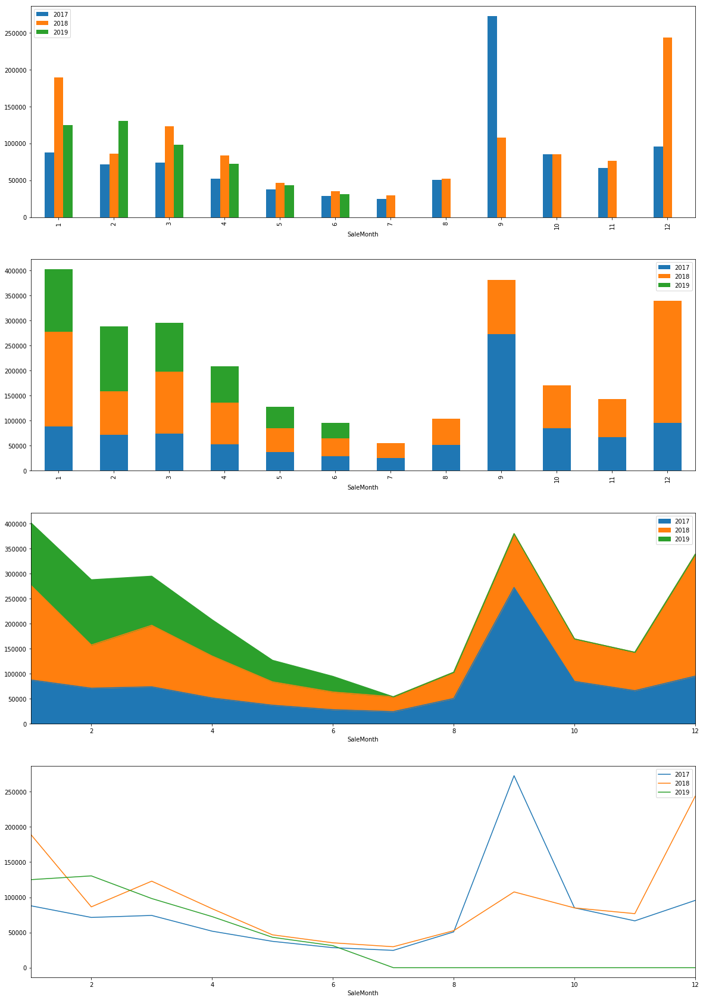

In [25]:
fig, axes = plt.subplots(4, 1, figsize=(20, 30))

qdata4.plot.bar(stacked=False, ax = axes[0])
qdata4.plot.bar(stacked=True, ax = axes[1])
qdata4.plot.area(ax = axes[2])
qdata4.plot(ax = axes[3])


In [26]:
frames_concat = [qdata4['2017'], qdata4['2018'], qdata4['2019']]

data_concat = pd.concat(frames_concat)
data_concat = data_concat.reset_index()

all_years = []
for i in range(1, 37):
    all_years.append(i)
    
data_concat['ThreeYrsPeriod'] = all_years
data_concat.columns = ['RealMonth', qname, 'ThreeYrsPeriod']
data_concat = data_concat.set_index('ThreeYrsPeriod')
data_concat = data_concat.drop(['RealMonth'], axis=1)

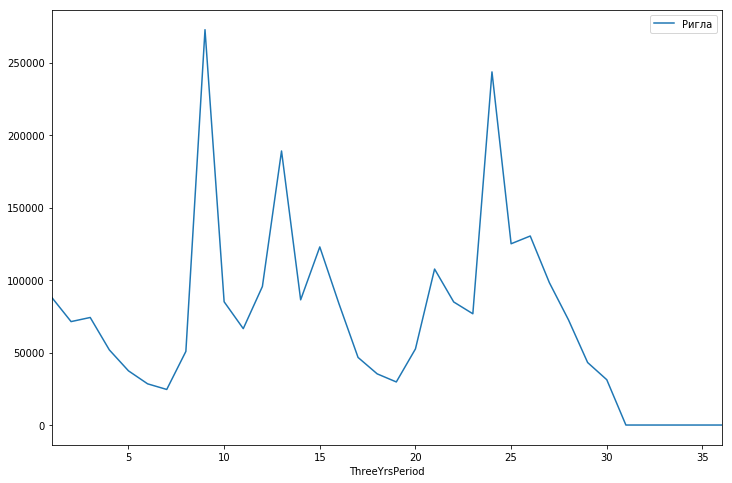

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))
data_concat.plot(ax = ax)

In [28]:
#data_concat

### Одномерные графики

In [29]:
%matplotlib inline

In [30]:
pharmid = 94

######

data_view = data2_2019
# 2019 год #

#data_view = data_cor
# 2018 год #

#data_view = data2017mer2
# 2017 год #

data_select, name1, label1 = select_network(pharmid, data_view)

data_select = data_select.set_index('SaleMonth')

In [31]:
#data_select['Sale20'].plot()
# Линия #

#data_select['Sale20'].plot.bar()
# Столбцы #

#data_select['Sale20'].plot.barh()
# Столбцы транспонированные #

#data_select['Sale20'].plot.area()
# Область #

#data_select['Sale20'].plot.hist()
# Гистограмма #

# Многомерные графики

In [59]:
pharmid = 94

#data_view = data2_2019
# 2019 год #

data_view = data_cor
# 2018 год #

#data_view = data2017mer2
# 2017 год #

data_select = data_view[(data_view['PharmNetworkID'] == pharmid)]
#data_select.head()

In [78]:
#data_select.plot.scatter(x='SaleMonth', y='Sale20')

# МЕСЯЦ СНИЗУ #


data_select.plot.scatter(x='Sale20', y='SaleMonth')

# МЕСЯЦ СБОКУ #

In [79]:
anomaly = 500

In [80]:
data_select[data_select['Sale20'] < anomaly].plot.scatter(x='Sale20', y='SaleMonth')

# ПОСТРОЕНИЕ С ФИЛЬТРАЦИЕЙ (БЕЗ АНОМАЛИЙ) 

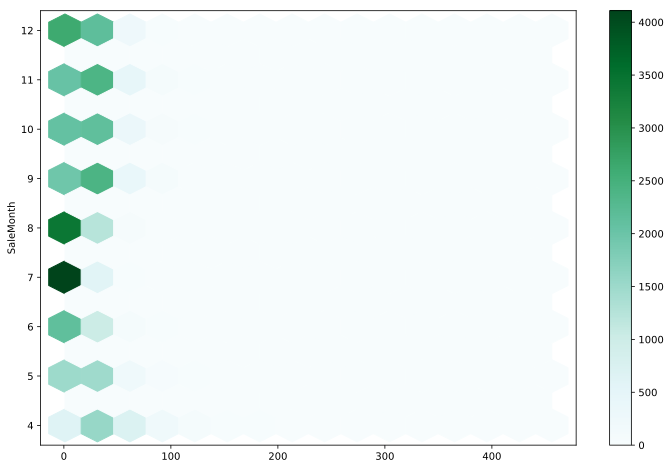

In [81]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))
data_select[data_select['Sale20'] < anomaly].plot.hexbin(x='Sale20', y='SaleMonth', gridsize=15, ax=ax)
plt.xlabel('')
plt.show()

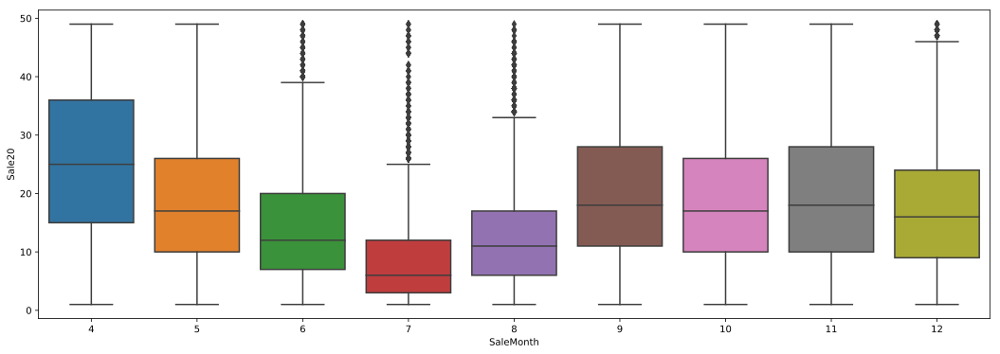

In [82]:
fig, ax = plt.subplots(figsize=(18,6))  
sns.boxplot(
     x='SaleMonth',
     y='Sale20',
#     x='Sale20',
#     y='SaleMonth',
    data=data_select[data_select['Sale20'] < 50]
)

Box plot и Violin plot
Box plot дословно график-коробка и, вобщем то, он и состоит из коробки, а также усиков и точек. Коробка показывает интерквантильный размах распределения, то есть соответственно 25% (Q1) и 75% (Q3) процентили. Черта внутри коробки обозначает медиану распределения. Усы отображают весь разброс точек кроме выбросов, то есть минимальные и максимальные значения, которые попадают в промежуток (Q1 - 1.5IQR, Q3 + 1.5IQR), где IQR = Q3 - Q1 - интерквантильный размах. Точки на графике это выбросы- те значения, которые не вписываются в промежуток значений, заданный усами графика.

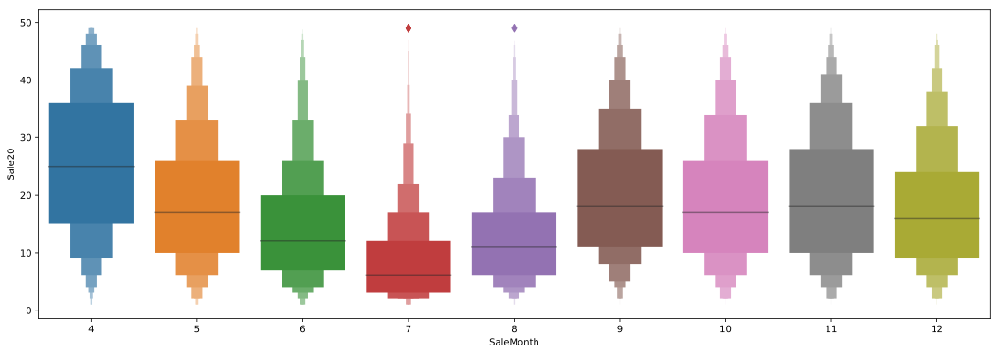

In [83]:
fig, ax = plt.subplots(figsize=(18,6))  
sns.boxenplot(
     x='SaleMonth',
     y='Sale20',
#     x='Sale20',
#     y='SaleMonth',
    data=data_select[data_select['Sale20'] < 50]
)

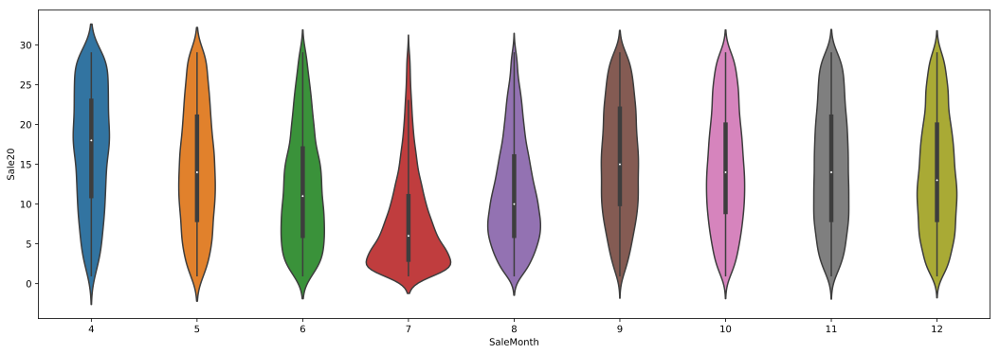

In [84]:
fig, ax = plt.subplots(figsize=(18,6))  
sns.violinplot(
    x='SaleMonth',
    y='Sale20',
    data=data_select[data_select['Sale20'] < 30]
)